In [1]:
using FFTW, Plots, NAJ, LaTeXStrings, Images, TestImages

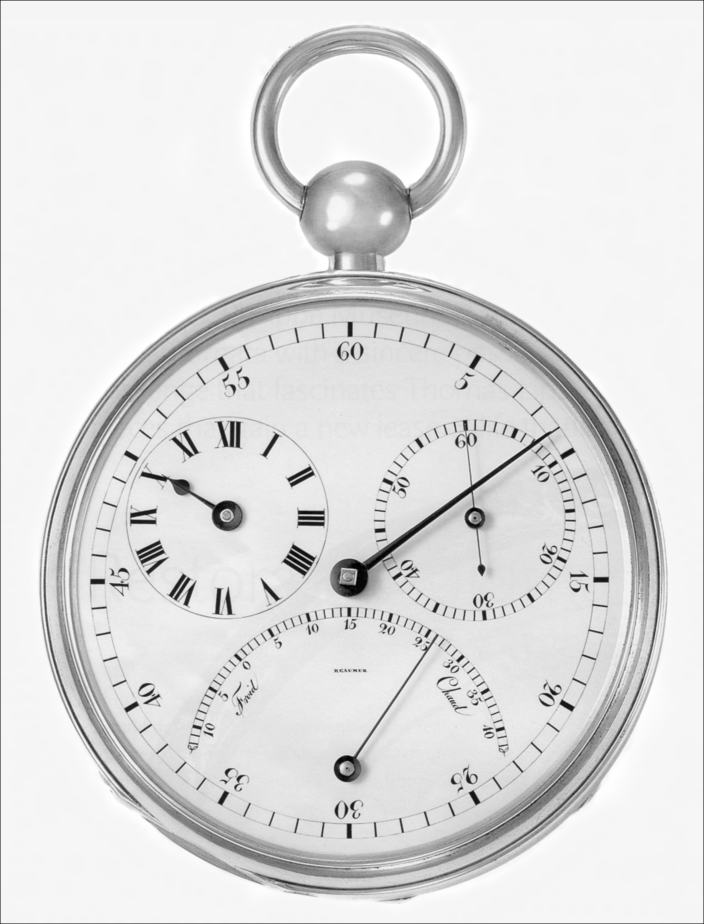

In [2]:
img = testimage_dip3e("Fig0220(a)")

In [3]:
q=fft(Float64.(img))

3692×2812 Matrix{ComplexF64}:
 9.08473e6+3.70051e-10im  2.55239e5-39610.7im    …  2.55239e5+39610.7im
  2.1871e5-1.88177e5im      49188.6-46834.4im         34849.1-71501.7im
  -32402.9-72626.8im       -8177.42+44725.1im        -21562.8+54823.9im
   44991.0-72873.8im        57049.1+1.01419e5im       40817.3+75599.7im
   94203.6+7976.0im        -60011.2+10440.2im        -59696.0+6686.27im
  -2356.17-8242.65im       -14715.7+20280.7im    …    -3268.8+10830.7im
   29250.1+28216.8im       -32534.2-19767.9im        -4179.67-11795.9im
   80080.7+38594.2im       -65198.9-21579.9im        -63172.0-19182.7im
   15871.7-21601.1im       -39197.6+16715.9im        -49221.7+27084.0im
   16544.8-3870.82im       -14440.4-5460.64im        -10826.9-4941.14im
          ⋮                                      ⋱  
   16544.8+3870.82im       -10826.9+4941.14im        -14440.4+5460.64im
   15871.7+21601.1im       -49221.7-27084.0im        -39197.6-16715.9im
   80080.7-38594.2im       -63172.0+19182.7im    …   

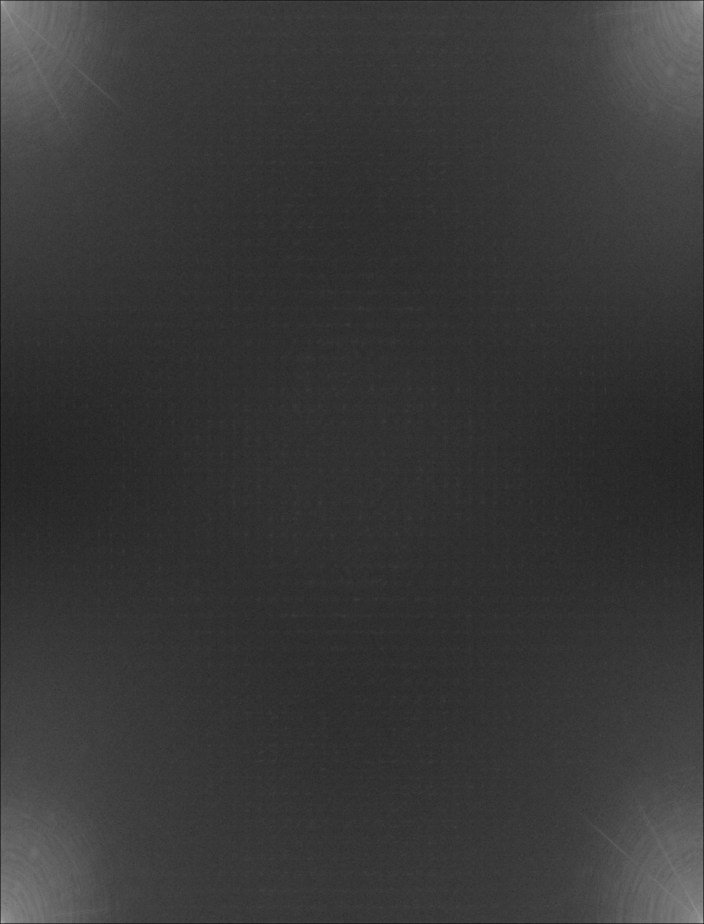

In [4]:
qs = log.(abs.(q) .+ 1.0)
qm, qM = extrema(qs)
fimg = (qs .- qm)./(qM-qm)
Gray.((qs .- qm)./(qM-qm))

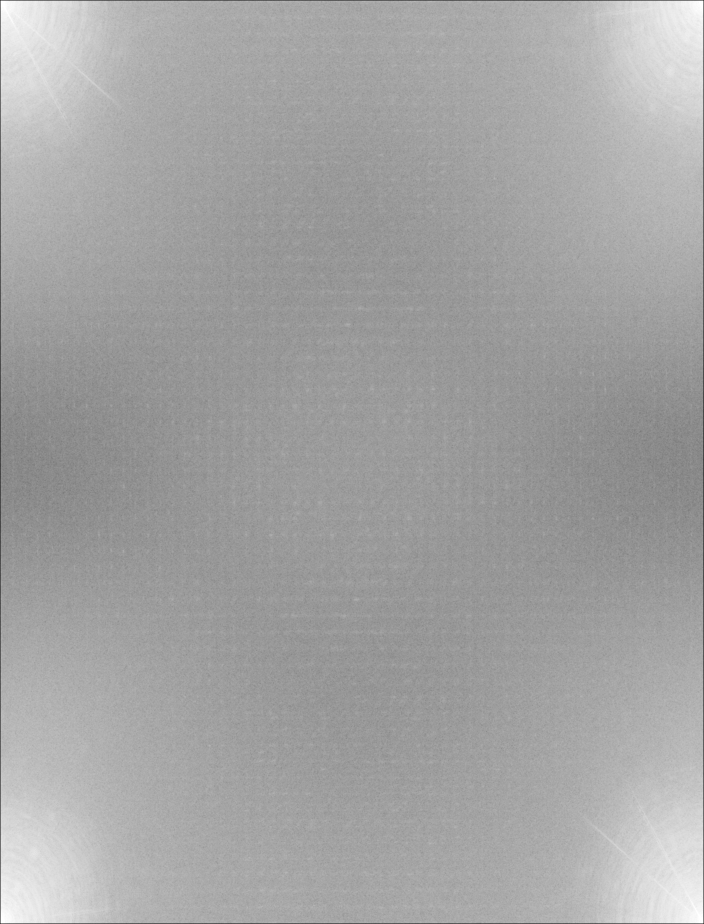

In [6]:
Gray.(log10.(qs .+ 1.0))

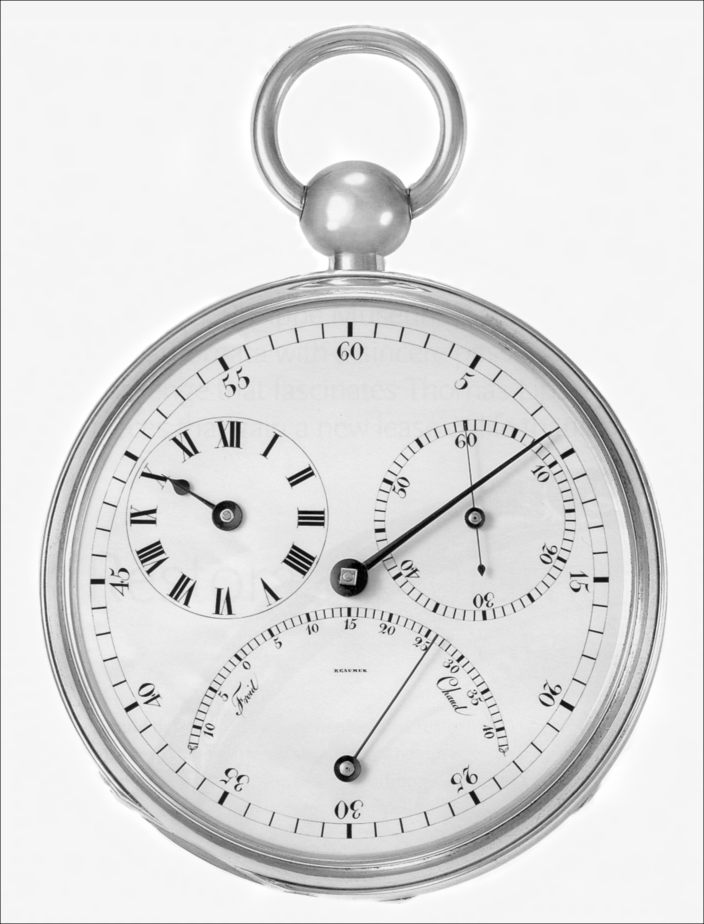

In [7]:
ifimg = real.(ifft(q))
pm, pM = extrema(ifimg)
Gray.((ifimg .- pm)./(pM-pm))


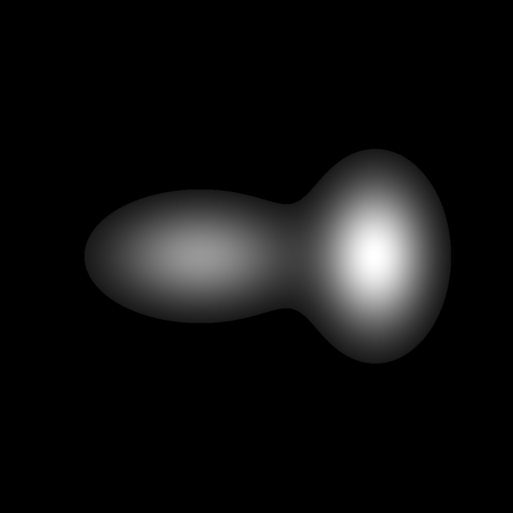

In [8]:
img2 = load("../imgs/tomography/object.png")


In [10]:
h=Float32.(img2)
fh = abs.(fft(h))
fh1, fh2 = extrema(fh)
s=(fh .- fh1)./(fh2-fh1)


1024×1024 Matrix{Float32}:
 1.0         0.480895    0.38727     …  0.327097     0.38727     0.480895
 0.897339    0.419844    0.33251        0.279103     0.33251     0.419844
 0.644126    0.28095     0.206214       0.166789     0.206214    0.28095
 0.36245     0.15715     0.0901297      0.0575431    0.0901297   0.15715
 0.154489    0.0915039   0.0380178      0.000591871  0.0380178   0.0915039
 0.0473954   0.0423841   0.0135092   …  0.00859187   0.0135092   0.0423841
 0.00774407  0.00278773  0.0109122      0.00439359   0.0109122   0.00278773
 0.00617689  0.0167761   0.0142323      0.00745685   0.0142323   0.0167761
 0.0111622   0.00944304  0.00220453     0.0034779    0.00220453  0.00944304
 0.00610997  0.00538932  0.008319       0.00182741   0.008319    0.00538932
 ⋮                                   ⋱                           
 0.00610997  0.00538932  0.008319    …  0.00182741   0.008319    0.00538932
 0.0111622   0.00944304  0.00220453     0.0034779    0.00220453  0.00944304
 0.00617

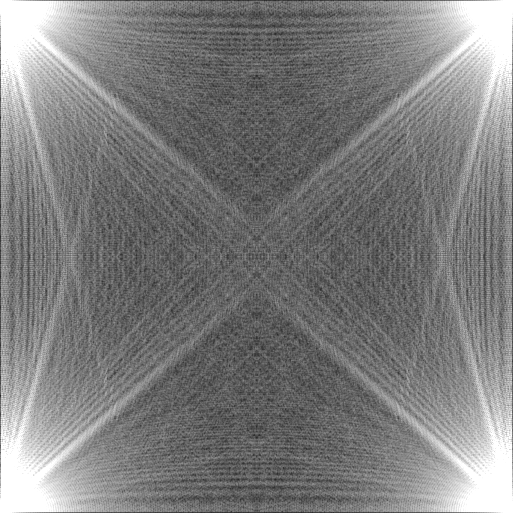

In [11]:

Gray.(log10.(fh .+ 1.0))


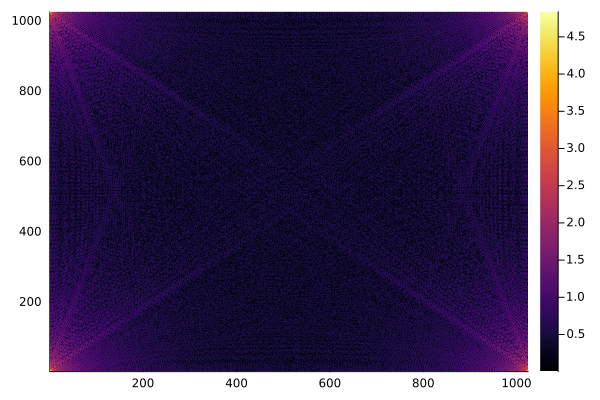

In [34]:
heatmap(log10.(abs.(fft(h)) .+ 1.0))

In [ ]:
A= zeros(Float64, (256, 256))
for x ∈ 1:256, y ∈ 1:256
    xp, yp = 32*round(x/32), 32*round(y/32)
    if (x-xp)^2 + (y-yp)^2 < 8
        A[x, y] = 1.0
    end
end

p1=heatmap(A, aspect_ratio = :equal, size=(600, 400), title= L"f")
Af = fft(A)
p2 = heatmap(log10.(abs.(Af) .+ 1.0), aspect_ratio = :equal, size= (600, 400), title = L"\log (\textrm{abs}(\mathfrak{F}[f]) +1)")

plot(p1, p2)


In [ ]:
x, y =825, 769
p, yp = 64*round(x/64), 64*round(y/64)

In [ ]:
extrema(abs.(Af))

In [ ]:
fft([1,1,1,1,1])

In [ ]:
ifft(fft([0,0,1,0,0]))

In [ ]:
ifft(fft([1,0,0,0,0]))

In [ ]:
length(t)